<a href="https://colab.research.google.com/github/CodeAjay/CPP/blob/main/Dogs_vs_Cats.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Cat Vs Dog Classification
##Download Dataset

dog=1, cat=0

In [1]:
!wget https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip

--2023-09-23 17:14:25--  https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip
Resolving download.microsoft.com (download.microsoft.com)... 23.215.125.109, 2600:1407:e800:592::317f, 2600:1407:e800:580::317f
Connecting to download.microsoft.com (download.microsoft.com)|23.215.125.109|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 824887076 (787M) [application/octet-stream]
Saving to: ‘kagglecatsanddogs_5340.zip’

kagglecatsanddogs_5 100%[===================>] 786.67M   139MB/s    in 5.8s    

2023-09-23 17:14:31 (135 MB/s) - ‘kagglecatsanddogs_5340.zip’ saved [824887076/824887076]



##Unzip the dataset


In [2]:
!unzip kagglecatsanddogs_5340.zip

Streaming output truncated to the last 5000 lines.
  inflating: PetImages/Dog/5500.jpg  
  inflating: PetImages/Dog/5501.jpg  
  inflating: PetImages/Dog/5502.jpg  
  inflating: PetImages/Dog/5503.jpg  
  inflating: PetImages/Dog/5504.jpg  
  inflating: PetImages/Dog/5505.jpg  
  inflating: PetImages/Dog/5506.jpg  
  inflating: PetImages/Dog/5507.jpg  
  inflating: PetImages/Dog/5508.jpg  
  inflating: PetImages/Dog/5509.jpg  
  inflating: PetImages/Dog/551.jpg   
  inflating: PetImages/Dog/5510.jpg  
  inflating: PetImages/Dog/5511.jpg  
  inflating: PetImages/Dog/5512.jpg  
  inflating: PetImages/Dog/5513.jpg  
  inflating: PetImages/Dog/5514.jpg  
  inflating: PetImages/Dog/5515.jpg  
  inflating: PetImages/Dog/5516.jpg  
  inflating: PetImages/Dog/5517.jpg  
  inflating: PetImages/Dog/5518.jpg  
  inflating: PetImages/Dog/5519.jpg  
  inflating: PetImages/Dog/552.jpg   
  inflating: PetImages/Dog/5520.jpg  
  inflating: PetImages/Dog/5521.jpg  
  inflating: PetImages/Dog/5522.jpg  

##Import the Modules


In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import os
import tqdm
import random
from keras.preprocessing.image import load_img
warnings.filterwarnings('ignore')

## Create Dataframe for input and output


In [10]:
input_path=[]
label=[]

for class_name in os.listdir("PetImages"):
  for path in os.listdir("PetImages/"+class_name):
    if class_name=="Cat":
      label.append(0)
    else:
      label.append(1)
    input_path.append(os.path.join("PetImages",class_name,path))

print(input_path[0],label[0])

PetImages/Cat/8738.jpg 0


In [16]:
df=pd.DataFrame()
df['images']=input_path
df['label']=label
df=df.sample(frac=1).reset_index(drop=True)
df.head()

,images,label
0,PetImages/Cat/12372.jpg,0
1,PetImages/Dog/5292.jpg,1
2,PetImages/Dog/1046.jpg,1
3,PetImages/Dog/3009.jpg,1
4,PetImages/Cat/7656.jpg,0


In [46]:
for i in df['images']:
  if'.jpg' not in i:
    print(i)

PetImages/Cat/Thumbs.db
PetImages/Dog/Thumbs.db


In [48]:
#delete db files


df=df[df['images']!='PetImages/Dog/Thubs.db']
df=df[df['images']!='PetImages/Cat/Thubs.db']
len(df)

25002

In [51]:
import PIL
l=[]
for image in df['images']:

  try:
    img=PIL.Image.open(image)
  except:
    l.append(image)
l

['PetImages/Cat/Thumbs.db',
 'PetImages/Dog/Thumbs.db',
 'PetImages/Cat/666.jpg',
 'PetImages/Dog/11702.jpg']

In [52]:

df=df[df['images']!='PetImages/Dog/Thubs.db']
df=df[df['images']!='PetImages/Cat/Thubs.db']
df=df[df['images']!='PetImages/Cat/666.jpg']
df=df[df['images']!='PetImages/Dog/11702.jpg']
len(df)

25000

In [55]:
#input split

from sklearn.model_selection import train_test_split
train, test=train_test_split(df,test_size=0.2, random_state=42)

In [39]:
test.head()

,images,label
9254,PetImages/Cat/4416.jpg,0
8049,PetImages/Cat/1932.jpg,0
23757,PetImages/Dog/6429.jpg,1
3463,PetImages/Dog/947.jpg,1
20539,PetImages/Cat/8063.jpg,0


##Exploratory Data Analysis

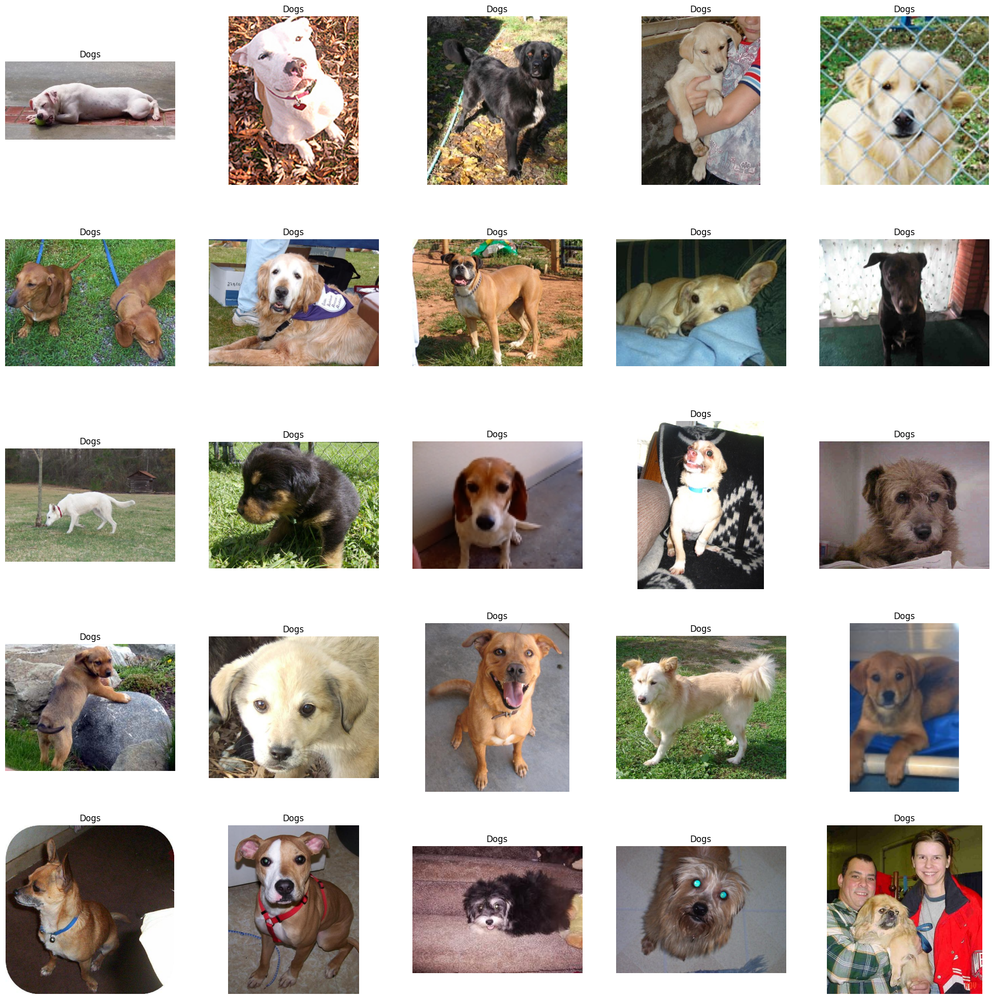

In [20]:
#to display grid of images
plt.figure(figsize=(25,25))
tmp=df[df['label']==1]['images']
start = random.randint(0, len(tmp))
files=tmp[start:start+25]

for index, file in enumerate(files):
  plt.subplot(5,5,index+1)
  img=load_img(file)
  img=np.array(img)
  plt.imshow(img)
  plt.title('Dogs')
  plt.axis('off')

##For showing cats Images


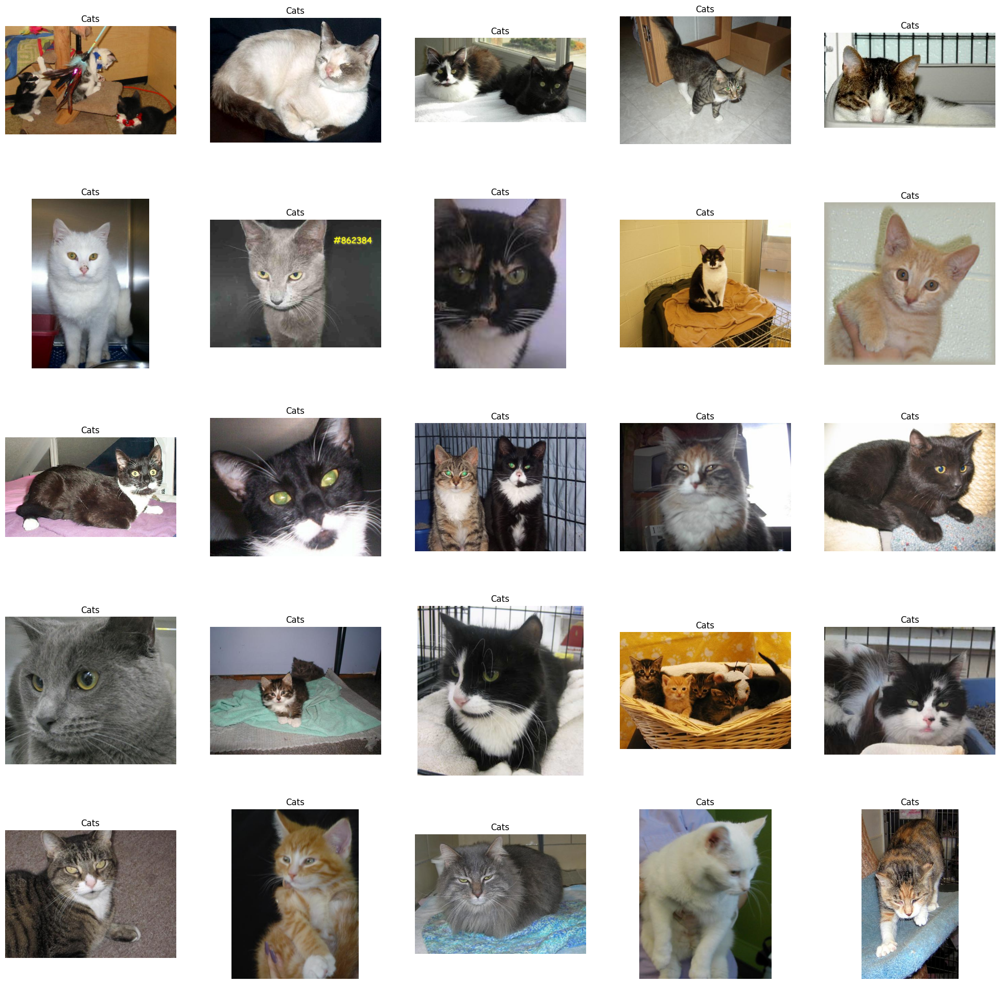

In [21]:
#to display grid of images
plt.figure(figsize=(25,25))
tmp=df[df['label']==0]['images']
start = random.randint(0, len(tmp))
files=tmp[start:start+25]

for index, file in enumerate(files):
  plt.subplot(5,5,index+1)
  img=load_img(file)
  img=np.array(img)
  plt.imshow(img)
  plt.title('Cats')
  plt.axis('off')

##

<Axes: ylabel='count'>

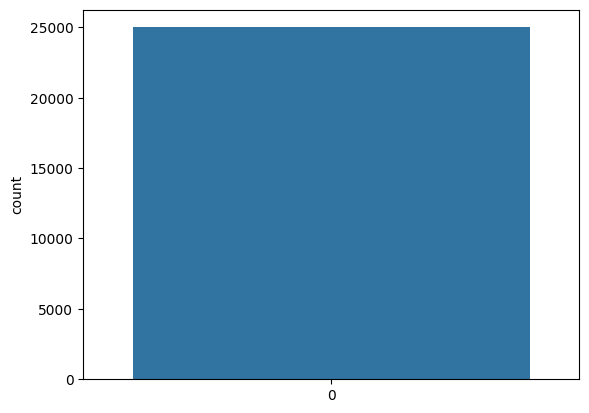

In [56]:
import seaborn as sns
sns.countplot(df['label'])

In [53]:
df['label']=df['label'].astype('str')

In [54]:
df.head()

,images,label
0,PetImages/Cat/12372.jpg,0
1,PetImages/Dog/5292.jpg,1
2,PetImages/Dog/1046.jpg,1
3,PetImages/Dog/3009.jpg,1
4,PetImages/Cat/7656.jpg,0


##Create Data Generator for Images

In [57]:
from keras.preprocessing.image import ImageDataGenerator
train_generator = ImageDataGenerator(
    rescale=1./255, #normalization of images
    rotation_range=40, #augmentation of images to avoid overfitting
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

val_generator =ImageDataGenerator(rescale=1./255)

train_iterator = train_generator.flow_from_dataframe(
    train,
    x_col='images',
    y_col='label',
    target_size=(128,128),
    batch_size=512,
    class_mode='binary'
)

val_iterator = val_generator.flow_from_dataframe(
    test,
    x_col='images',
    y_col='label',
    target_size=(128,128),
    batch_size=512,
    class_mode='binary'
)

Found 19999 validated image filenames belonging to 2 classes.
Found 4999 validated image filenames belonging to 2 classes.


##Model Creation


In [58]:
from keras.src.backend import flatten
from keras import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense


model = Sequential([
    Conv2D(16,(3,3),activation='relu', input_shape=(128,128,3)),
    MaxPool2D((2,2)),
    Conv2D(32,(3,3),activation='relu'),
    MaxPool2D((2,2)),
    Conv2D(32,(3,3),activation='relu'),
    MaxPool2D((2,2)),
    Flatten(),
    Dense(512,activation='relu'),
    Dense(1,activation='sigmoid')
])



In [59]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics='accuracy')
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 126, 126, 16)      448       
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 63, 63, 16)        0         
 g2D)                                                            
                                                                 
 conv2d_7 (Conv2D)           (None, 61, 61, 32)        4640      
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 30, 30, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_8 (Conv2D)           (None, 28, 28, 32)        9248      
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 14, 14, 32)       

##Model Training


In [61]:
history = model.fit(train_iterator, epochs=10, validation_data=val_iterator)

Epoch 1/10
40/40 [==============================] - 122s 3s/step - loss: 0.6724 - accuracy: 0.5734 - val_loss: 0.6217 - val_accuracy: 0.6599
Epoch 2/10
40/40 [==============================] - 139s 3s/step - loss: 0.6063 - accuracy: 0.6684 - val_loss: 0.5569 - val_accuracy: 0.7115
Epoch 3/10
40/40 [==============================] - 163s 4s/step - loss: 0.5713 - accuracy: 0.7000 - val_loss: 0.5382 - val_accuracy: 0.7239
Epoch 4/10
40/40 [==============================] - 124s 3s/step - loss: 0.5373 - accuracy: 0.7305 - val_loss: 0.5110 - val_accuracy: 0.7481
Epoch 5/10
40/40 [==============================] - 119s 3s/step - loss: 0.5247 - accuracy: 0.7391 - val_loss: 0.5107 - val_accuracy: 0.7423
Epoch 6/10
40/40 [==============================] - 114s 3s/step - loss: 0.5100 - accuracy: 0.7457 - val_loss: 0.4753 - val_accuracy: 0.7670
Epoch 7/10
40/40 [==============================] - 113s 3s/step - loss: 0.4882 - accuracy: 0.7639 - val_loss: 0.4896 - val_accuracy: 0.7670
Epoch 8/10
40

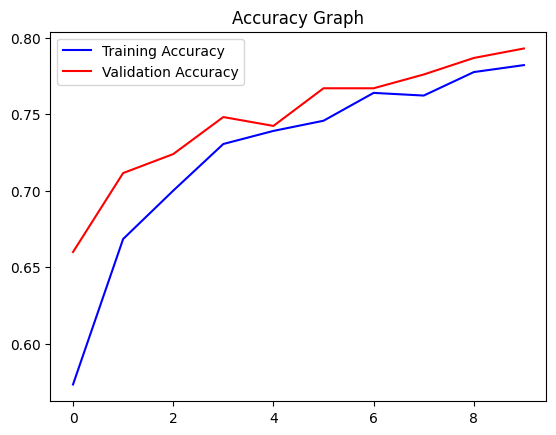

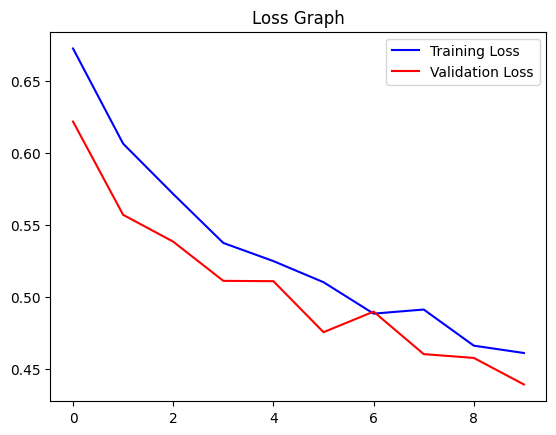

In [62]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Accuracy Graph')
plt.legend()
plt.figure()

loss = history.history['loss']
val_loss=history.history['val_loss']

plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss Graph')
plt.legend()
plt.show()